(145, 5, 1) (145, 1)


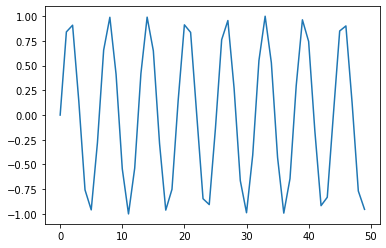

In [1]:
### Get training data

import numpy as np
import math
import matplotlib.pyplot as plt
import random

sin_wave = np.array([math.sin(x) for x in np.arange(200)])

plt.plot(sin_wave[:50])

X = []
Y = []

seq_len = 5
num_records = len(sin_wave) - seq_len

for i in range(num_records - 50):
    X.append(sin_wave[i:i+seq_len])
    Y.append(sin_wave[i+seq_len])
    
X = np.array(X)
X = np.expand_dims(X, axis=2)

Y = np.array(Y)
Y = np.expand_dims(Y, axis=1)

print(X.shape, Y.shape)

In [2]:
### Get test data

X_val = []
Y_val = []

for i in range(num_records - 50, num_records):
    X_val.append(sin_wave[i:i+seq_len])
    Y_val.append(sin_wave[i+seq_len])
    
X_val = np.array(X_val)
X_val = np.expand_dims(X_val, axis=2)

Y_val = np.array(Y_val)
Y_val = np.expand_dims(Y_val, axis=1)

print(X_val.shape, Y_val.shape)

(50, 5, 1) (50, 1)


In [3]:
### Meta-Parameters

learning_rate = 0.001 # 0.0001    
nepoch = 25             
T = seq_len               
hidden_dim = 128       
output_dim = 1

bptt_truncate = 5
min_clip_value = -10
max_clip_value = 10

U = np.random.uniform(0, 1, (hidden_dim, T))
W = np.random.uniform(0, 1, (hidden_dim, hidden_dim))
V = np.random.uniform(0, 1, (output_dim, hidden_dim))

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

In [4]:
### How to get losses

def loser(test = False, text = False, batch_size = "all"):
    if(test): X_, Y_ = X, Y 
    else:     X_, Y_ = X_val, Y_val  
    if(batch_size != "all"):
        index = [i for i in range(len(X_))]
        random.shuffle(index)
        index = index[:batch_size]
        X_, Y_ = X_[index], Y_[index]
    loss = 0.0
    for i in range(X_.shape[0]):
        x, y = X_[i], Y_[i]                    
        prev_s = np.zeros((hidden_dim, 1))   
        for t in range(T):
            new_input = np.zeros(x.shape)    
            new_input[t] = x[t]
            mulu = np.dot(U, new_input)
            mulw = np.dot(W, prev_s)
            add = mulw + mulu
            s = sigmoid(add)
            if(text):
                print("\nU:\t{}\t*\tNew Input:\t{}\t\t=\tmulu:\t{}.".format(U.shape, new_input.shape, mulu.shape))
                print("W:\t{}\t*\tprev_s:\t\t{}\t=\tmulw:\t{}.".format(W.shape, prev_s.shape, mulw.shape))
                print("mulu + mulw\t=\ts:\t{}.".format(s.shape))
                print("mulu: {} min, {} max. \tmulw: {} min, {} max.".format(
                    round(mulu.min(), 3), 
                    round(mulu.max(), 3), 
                    round(mulw.min(), 3), 
                    round(mulw.max(), 3)))
            prev_s = s
        mulv = np.dot(V, s)
        if(text):
            print("\nV:\t{}\t*\ts:\t\t{}\t=\tmulv:\t{}.\ty: {}.".format(V.shape, s.shape, mulv.shape, y.shape))
            print("mulv: {} min, {} max.".format(round(mulv.min(), 3), round(mulv.max(), 3)))
        loss_per_record = (y - mulv)**2 / 2
        loss += loss_per_record
    loss = loss / float(y.shape[0])
    return(loss)

loser(test = True, text = True, batch_size = 1)


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.641 min, -0.015 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.296 max. 	mulw: 24.308 min, 30.289 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.005 min, 0.957 max. 	mulw: 57.731 min, 71.905 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.73 max. 	mulw: 57.731 min, 71.905 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.157 min, -0.0 max. 	mulw: 57.731 min, 71.905 max.

V:	(1, 128)	*	s:		(128, 1)	=	mulv:	(1, 1).	y: (1,).
mu

array([[2014.64286699]])

In [5]:
### Train!

for epoch in range(nepoch):
    # train model
    for i in range(Y.shape[0]):
        x, y = X[i], Y[i]

        layers = []
        prev_s = np.zeros((hidden_dim, 1))
        dU = np.zeros(U.shape)
        dV = np.zeros(V.shape)
        dW = np.zeros(W.shape)

        dU_t = np.zeros(U.shape)
        dV_t = np.zeros(V.shape)
        dW_t = np.zeros(W.shape)

        dU_i = np.zeros(U.shape)
        dW_i = np.zeros(W.shape)
        
        # forward pass
        for t in range(T):
            new_input = np.zeros(x.shape)
            new_input[t] = x[t]
            mulu = np.dot(U, new_input)
            mulw = np.dot(W, prev_s)
            add = mulw + mulu
            s = sigmoid(add)
            print("\nU:\t{}\t*\tNew Input:\t{}\t\t=\tmulu:\t{}.".format(U.shape, new_input.shape, mulu.shape))
            print("W:\t{}\t*\tprev_s:\t\t{}\t=\tmulw:\t{}.".format(W.shape, prev_s.shape, mulw.shape))
            print("mulu + mulw\t=\ts:\t{}.".format(s.shape))
            print("mulu: {} min, {} max. \tmulw: {} min, {} max.".format(
                round(mulu.min(), 3), 
                round(mulu.max(), 3), 
                round(mulw.min(), 3), 
                round(mulw.max(), 3)))
            layers.append({'s':s, 'prev_s':prev_s})
            prev_s = s
        mulv = np.dot(V, s)
        print("\nV:\t{}\t*\ts:\t\t{}\t=\tmulv:\t{}.\ty: {}.".format(W.shape, s.shape, mulw.shape, y.shape))
        print("mulv: {} min, {} max.".format(round(mulv.min(), 3), round(mulv.max(), 3)))
        # derivative of pred
        dmulv = (mulv - y)
        
        print(dmulv.shape, mulv.shape, y.shape)

        # backward pass
        for t in range(T):
            dV_t = np.dot(dmulv, np.transpose(layers[t]['s']))
            dsv = np.dot(np.transpose(V), dmulv)

            ds = dsv
            dadd = add * (1 - add) * ds

            dmulw = dadd * np.ones_like(mulw)

            dprev_s = np.dot(np.transpose(W), dmulw)


            for i in range(t-1, max(-1, t-bptt_truncate-1), -1):
                print(i)
                ds = dsv + dprev_s
                dadd = add * (1 - add) * ds

                dmulw = dadd * np.ones_like(mulw)
                dmulu = dadd * np.ones_like(mulu)
                
                print("dW_i BEFORE:", dW_i.shape)

                dW_i = np.dot(W, layers[t]['prev_s'])    # dW_i changes shape here!
                dprev_s = np.dot(np.transpose(W), dmulw)
                
                print("dW_i AFTER:", dW_i.shape)
                print("dU_i BEFORE:", dU_i.shape)

                new_input = np.zeros(x.shape)
                new_input[t] = x[t]
                dU_i = np.dot(U, new_input)              # dU_i changes shape here!
                dx = np.dot(np.transpose(U), dmulu)
                
                print("dU_i AFTER:", dU_i.shape)

                dU_t += dU_i
                dW_t += dW_i
                
            dV += dV_t
            dU += dU_t
            dW += dW_t

            if dU.max() > max_clip_value:
                dU[dU > max_clip_value] = max_clip_value
            if dV.max() > max_clip_value:
                dV[dV > max_clip_value] = max_clip_value
            if dW.max() > max_clip_value:
                dW[dW > max_clip_value] = max_clip_value


            if dU.min() < min_clip_value:
                dU[dU < min_clip_value] = min_clip_value
            if dV.min() < min_clip_value:
                dV[dV < min_clip_value] = min_clip_value
            if dW.min() < min_clip_value:
                dW[dW < min_clip_value] = min_clip_value

        # update
        U -= learning_rate * dU
        V -= learning_rate * dV
        W -= learning_rate * dW
    
    loss = loser()
    val_loss = loser(True)
    print('Epoch: ', epoch + 1, ', Loss: ', loss, ', Val Loss: ', val_loss)
    
    #break


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.0 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.004 min, 0.839 max. 	mulw: 28.865 min, 35.953 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.005 min, 0.903 max. 	mulw: 57.731 min, 71.905 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.138 max. 	mulw: 57.731 min, 71.905 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.75 min, -0.001 max. 	mulw: 57.731 min, 71.905 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.663 min, -0.017 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.018 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.004 min, 0.848 max. 	mulw: 0.709 min, 7.827 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.005 min, 0.894 max. 	mulw: 1.027 min, 15.26 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mu

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.013 min, 0.633 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.302 min, -0.002 max. 	mulw: -0.701 min, 0.74 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.952 min, -0.006 max. 	mulw: -1.068 min, 1.067 max.

U:	(128, 5)	*	New 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.986 min, -0.025 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.389 min, -0.004 max. 	mulw: -0.858 min, 0.649 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s

dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.016 min, 0.853 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.004 min, 0.885 max. 	mulw: -0.783 min, 1.245 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.104 max. 	mulw: -1.412 min, 1.605 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.756 min, -0.002 max. 	mulw: -1.318 min, 1.797 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.012 min, 0.619 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.319 min, -0.003 max. 	mulw: -0.673 min, 0.878 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.955 min, -0.006 max. 	mulw: -0.949 min, 1.087 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.71 min, -0.003 max. 	mulw: -1.251 min, 1.864 max.

U:	

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.017 min, 0.938 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.234 max. 	mulw: -0.86 min, 0.916 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.675 min, -0.004 max. 	mulw: -1.151 min, 1.047 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.193 min, -0.004 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.927 min, -0.01 max. 	mulw: -0.507 min, 0.544 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.805 min, -0.006 max. 	mulw: -0.935 min, 0.932 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.586 min, -0.014 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.997 min, -0.011 max. 	mulw: -0.649 min, 0.601 max.

U:	(128, 5)	*	New Input:	(5, 1


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.002 min, 0.413 max. 	mulw: -0.845 min, 1.226 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.012 min, 0.99 max. 	mulw: -1.311 min, 1.694 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.026 min, 0.026 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTE

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.507 min, -0.507 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.009 min, 0.546 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.986 max. 	mulw: -0.732 min, 0.924 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.003 min, 0.517 max. 	mulw: -1.42 min, 1.478 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.413 min, -0.001 max. 	mulw: -1.357 min, 1.601 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.985 min, 0.015 max. 	mulw: -1.547 min, 1.614 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
m

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.004 min, 0.975 max. 	mulw: -1.101 min, 1.017 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.005 min, 0.635 max. 	mulw: -1.41 min, 1.708 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.952 min, 0.952 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTE

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.012 m

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.012 min, 0.958 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.72 max. 	mulw: -0.744 min, 0.899 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.171 min, -0.001 max. 	mulw: -1.229 min, 1.217 max.

U:	(128, 5)	*	New In

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.01 min, 0.676 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.967 max. 	mulw: -0.55 min, 0.871 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.002 min, 0.369 max. 	mulw: -1.453 min, 1.09 max.

U:	(128, 5)	*	New Input:	(

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.01 min, 0.808 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.043 min, -0.0 max. 	mulw: -0.787 min, 0.815 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.839 min, -0.003 max. 	mulw: -0.991 min, 1.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.009 min, 0.876 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.087 max. 	mulw: -0.831 min, 0.965 max.

U:	(128, 5)	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.005 min, 0.898 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu:

dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.005 min, 0.643 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.282 min, -0.001 max. 	mulw: -0.778 min, 0.896 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.92

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.006 min, 0.753 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.935 max. 	mulw: -0.57 min, 0.93 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.261 max. 	mulw: -1.141 min, 1.183 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.637 min, 0.003 max. 	mulw: -1.345 min, 1.169 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.983 min, 0.027 max. 	mulw: -1.381 min, 1.562 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.638 


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.659 max. 	mulw: -0.428 min, 0.427 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.005 min, 0.961 max. 	mulw: -1.128 min, 0.975 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.381 max. 	mulw: -1.323 min, 1.256 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.556 min, 0.011 max. 	mulw: -1.163 min, 1.507 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.371 min, -0.371 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.002 min, 0.165 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.001 min, 0.902 max. 	mulw: -0.577 min, 0.57 max.

U:	(128, 5

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.978 min, -0.018 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.383 min, -0.003 max. 	mulw: -0.954 min, 0.568 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.003 min, 0.555 max. 	mulw: -0.777 min, 0.729 max.

U:	(128, 5)	*	New

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.917 min, -0.016 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.812 min, -0.007 max. 	mulw: -0.941 min, 0.659 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.035 max. 	mulw: -0.823 min, 0.759 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.837 max. 	mulw: -1.185 min, 0.943 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.002 min, 0.97 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.0 min, 0.37 max. 	mulw: -0.69 min, 0.86 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.55 min, -0.001 max. 	mulw: -1.16 min, 1.071 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.96 min, 0.013 max. 	mulw: -1.342 min, 1

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.002 min, 0.806 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.043 min, -0.0 max. 	mulw: -0.719 min, 1.014 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.83 min, -0.002 max. 	mulw: -1.092 min, 1.322 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.857 min, 0.012 max. 	mulw: -1.182 min, 1.842 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(

dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.002 min, 0.493 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.45 min, -0.001 max. 	mulw: -0.67 min, 0.709 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.959 min, -0.002 max. 	mulw

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.938 min, 0.032 max. 	mulw: -1.628 min, 1.527 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.077 min, -0.077 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
Epoch:  3 , Loss:  [[14.15871528]] , Val Loss:  [[41.53770999]]

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.0 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.822 max. 	mulw: -0.49 min, 0.557 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 12

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.53 min, -0.005 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.131 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.636 min, -0.006 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.29 max. 	mulw: -0.731 min, 0.457 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.003 min, 0.933 max. 	mulw: -0.952 min, 0.832 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.004 min, 0.717 max. 	mulw: -1.289 min, 1.187 max.

U:	(12

dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.944 min, -0.01 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.258 min, -0.001 

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.956 min, -0.009 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inp

dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.669 min, -0.004 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.965 min, -0.004 max. 	mulw: -0.754 min, 0.586 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.375 min, -0.001 max. 	mulw: -0.914 min, 0.818 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	m

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.005 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.242 min, -0.001 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.002 min, 0.667 max. 	mulw: -0.43 min, 0.434 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.003 min, 0.946 max. 	mulw: -0.907 min, 1.258 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.004 min, 0.364 max. 	mulw: -1.283 min, 1.532 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.571 min, 0.019 max. 	mulw: -1.327 min, 1.6


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.009 min, 0.897 max. 	mulw: -1.291 min, 0.989 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.026 min, 0.817 max. 	mulw: -1.315 min, 1.467 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.08 min, 0.08 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTE


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.938 min, -0.001 max. 	mulw: -0.944 min, 1.05 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.358 min, 0.008 max. 	mulw: -1.343 min, 1.114 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.026 min, 0.582 max. 	mulw: -1.547 min, 1.12 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.243 min, -0.243 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.191 min, 0.0 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.002 min, 0.358 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.571 min, 0.001 max. 	mulw: -0.5 min, 0.604 max.

U:	(128, 5

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.949 min, -0.001 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.733 min, -0.001 max. 	mulw: -0.632 min, 0.572 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.144 max. 	mulw: -0.697 min, 0.76 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.015 min, 0.881 max. 	mulw: -0.971 min, 0.939 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.032 min, 0.837 max. 	mulw: -1.241 min, 1.575 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).


0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.655 min, 0.002 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.962 min, -0.001 max. 	mulw: -0.529 min, 0.518 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.387 min, -0.0 max. 	mulw: -0.712 min, 0.908 


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.149 min, 0.0 max. 	mulw: -1.343 min, 1.631 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.873 min, 0.027 max. 	mulw: -1.628 min, 1.763 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.83 min, 0.043 max. 	mulw: -1.899 min, 1.465 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.437 min, -0.437 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (12

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.728 min, 0.001 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.0 min, 0.163 max. 	mulw: -0.532 min, 0.489 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.001 min, 0.881 max. 	mulw: 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.25 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.768 min, 0.003 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.922 min, -0.0 max. 	mulw: -0.87 min, 0.553 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.235 min, -0.0 max. 	mulw: -1.058 min, 0.844 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu +

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.01 min, 0.611 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.095 min, 0.001 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.453 min, 0.004 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.966 min, 0.001 max. 	mulw: -0.481 min, 0.509 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.586 min, 0.0 max. 	mulw: -0.722 min, 0.891 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.009 min, 0.318 max. 	mulw: -1.123 min, 1.231 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.048 min, 0.976 max.

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.015 min, 0.851 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.009 min, 0.851 max. 	mulw: -0.806 min, 1.213 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(12

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.483 min, 0.003 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.002 min, 0.453 max. 	mulw: -0.448 min, 0.429 max.

U:	(128,

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.013 min, 0.643 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.013 min, 0.949 max. 	mulw: -0.581 min, 0.887 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.001 min, 0.385 max. 	mulw: -1.311 min, 1.067 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mul

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.738 min, 0.007 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.001 min, 0.145 max. 	mulw: -0.549 min, 0.427 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.866 max. 	mulw: -0.764 min, 0.84 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.024 min, 0.935 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.259 max. 	mulw: -0.82 min, 0.933 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.619 min, 0.002 max. 	mulw: -0.966 min, 1.09 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.94 min, 0.041 max. 	mulw: -1.099 min, 1.068 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.404 min, 0.026 max. 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.632 min, 0.007 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.002 min, 0.286 max. 	mulw: -0.682 min, 0.447 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.0 min, 0.912 max. 	mulw: -0.948 min, 0.846 max.

U:	(128, 5)	*	New In

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.755 min, 0.01 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.922 min, 0.003 max. 	mulw: -0.553 min, 0.611 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.249 min, 0.0 max. 	mulw: -0.771 min, 0.814 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.021 min, 0.644 max. 	mulw: -0.855 

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.026 min, 0.97 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input

dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.841 min, 0.011 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.868 min, 0.003 max. 	mulw: -1.005 min, 0.621 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.109 min, 0.0 max. 	mulw: -1.025 min, 0.826 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.024 min, 0.744 max. 	mulw: -1.039 min, 0.902 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.013 min, 0.503 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.426 min, 0.004 max. 	mulw: -0.668 min, 0.759 max.

U:	(128, 5)	*	New Input:	(5, 1)	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.001 min, 0.035 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.009 min, 0.372 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.025 min, 0.905 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.028 


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.758 min, 0.007 max. 	mulw: -0.477 min, 0.461 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.886 min, 0.003 max. 	mulw: -1.165 min, 0.85 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.218 min, 0.01 max. 	mulw: -1.431 min, 0.982 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.045 min, 0.699 max. 	mulw: -1.315 min, 1.151 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.081 min, -0.081 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
d

dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
Epoch:  6 , Loss:  [[12.3123265]] , Val Loss:  [[36.08981955]]

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.0 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.012 min, 0.805 max. 	mulw: -0.487 min, 0.525 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.002 min, 0.846 max. 	mulw: -1.127 min, 0.969 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.005 min, 0.134 max

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.034 min, 0.964 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.007 min, 0.392 max. 	mulw: -0.819 min, 0.956 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.943 min, 0.018 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.722 min, 0.005 max. 	mulw: -0.709 min, 0.483 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.0 min, 0.141 max. 	mulw: -0.755 min, 0.864 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.034 min, 0.874 max. 	mulw: -0.912 min, 0.922 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.973 min, 0.019 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128,

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.032 min, 0.879 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.002 min, 0.117 max. 	mulw: -0.789 min, 0.871 max.

U:	(128,

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.98 min, 0.02 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.032 min, 0.896 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.965 min, 0.02 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.372 min, 0.003 max. 	mulw: -0.862 min, 0.583 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.001 min, 0.532 max. 	mulw: -0.883 min, 0.738 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.009 min, 0.305 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.016 min, 0.922 max. 	mulw: -0.519 min, 0.594 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.679 max. 	mulw: -1.2 min, 1.01 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.166 min, 0.008 max. 	mulw: -1.472 min, 1.373 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.764 min, 0.019 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.909 min, 0.008 max. 	mulw: -0.886 min, 0.631 max.

U:	(128,

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.014 min, 0.44 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.017 min, 0.946 max. 	mulw: -0.623 min, 0.908 max.

U:	(128, 


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.043 min, 0.001 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.825 min, 0.01 max. 	mulw: -0.533 min, 0.414 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.833 min, 0.004 max. 	mulw: -1.136 min, 0.821 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.093 min, 0.005 max. 	mulw: -1.155 min, 1.01 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.057 min, 0.789 max. 	mulw: -1.27 min, 1.093 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
m


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.363 min, 0.01 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.008 min, 0.555 max. 	mulw: -0.461 min, 0.397 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.929 max. 	mulw: -0.841 min, 1.208 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.021 min, 0.473 max. 	mulw: -1.24 min, 1.649 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.46 min, 0.029 max. 	mulw: -1.357 min, 1.783 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
m

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.027 min, 0.703 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.184 min, 0.003 max. 	mulw: -0.665 min, 0.855 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.864 min, 0.005 max. 	mulw: -1.004 min, 0.853 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mul

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.923 min, 0.022 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

Epoch:  7 , Loss:  [[11.80130779]] , Val Loss:  [[34.28441491]]

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.0 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.015 min, 0.799 max. 	mulw: -0.459 min, 0.515 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.004 min, 0.84 max. 	mulw: -1.073 min, 1.205 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.007 min, 0.133 max. 	mulw: -1.352 min, 1.135 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.756 min, 0.054 max. 	mulw: -1.459 min, 1.229 ma

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.531 min, 0.018 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.005 min, 0.146 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.017 min, 0.866 max. 	mulw: -0.505 min, 0.526 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.004 min, 0.772 max. 	mulw: -1.111 min, 1.045 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.008 min, 0.0 max. 	mulw: -1.465 min, 1.238 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.845 min, 0.062 max. 	mulw: -1.706 min, 1.494 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).



U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.378 min, 0.002 max. 	mulw: -0.903 min, 0.794 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.029 min, 0.526 max. 	mulw: -1.024 min, 0.937 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.074 min, 1.005 max. 	mulw: -1.117 min, 1.225 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.154 min, 0.154 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (1

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.042 min, 0.936 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.016 min, 0.703 max. 	mulw: -0.632 min, 0.95 max.

U:	(128, 5)	*	New Input:	(5, 1)		

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.751 min, 0.025 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.909 min, 0.012 max. 	mulw: -0.558 min, 0.558 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.245 min, 0.001 max. 	mulw: -0.748 min, 0.961 max.

U:	(128, 5)	*	New 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.017 min, 0.424 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128,


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.849 min, 0.057 max. 	mulw: -1.186 min, 1.072 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.115 min, 0.01 max. 	mulw: -1.629 min, 1.216 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.314 min, -0.314 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i A

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.962 min, 0.03 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.37 min, 0.005 max. 	mulw: -0.63 min, 0.493 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.002 min, 0.528 max. 	mulw: -0.711 min, 0.784 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.048 min, 0.951 max. 	mulw: -1.103 min, 0.861 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.044 min, 0.94 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + m

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.761 min, 0.026 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.903 min, 0.012 max. 	mulw: -0.638 min, 0.606 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.229 min, 0.001 max. 	mulw: -0.762 min, 0.838 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mul

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.047 min, 0.965 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.844 min, 0.029 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.847 min, 0.011 max. 	mulw: -0.872 min, 0.672 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.091 min, 0.0 max. 	mulw: -0.983 min, 0.763 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.042 min, 0.748 max. 	mulw: -1.146 min, 0.98 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.025 min, 0.564 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.021 min, 0.942 max. 	mulw: -0.745 min, 0.919 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.458 max. 	mulw: -1.362 min, 1.561 

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.034 min, 0.7 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.182 min, 0.004 max. 	mulw: -0.693 min, 0.722 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.858 min, 0.007 max. 	mulw: -0.973 min, 0.977 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.767 min, 0.053 max. 	mulw: -1.21 min, 1.439 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.222 min, 0.009 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.013 min, 0.66 max. 	mulw: -0.426 min, 0.429 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(

Epoch:  8 , Loss:  [[11.51279607]] , Val Loss:  [[33.54957002]]

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.0 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.018 min, 0.794 max. 	mulw: -0.462 min, 0.486 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.006 min, 0.835 max. 	mulw: -1.141 min, 1.039 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.008 min, 0.133 max. 	mulw: -1.422 min, 1.372 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.757 min, 0.061 max. 	mulw: -1.559 min, 1.38 ma


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.021 min, 0.4 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.512 min, 0.011 max. 	mulw: -0.597 min, 0.684 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.922 min, 0.008 max. 	mulw: -0.935 min, 0.998 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.507 min, 0.037 max. 	mulw: -1.265 min, 1.312 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.039 min, 0.423 max. 	mulw: -1.673 min, 1.248 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).


dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.007 

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.417 min, 0.019 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.937 min, 0.017 max. 	mulw: -0.474 min, 0.54 max.

U:	(128, 

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.074 min, 0.907 max. 	mulw: -1.252 min, 1.169 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.234 min, 0.234 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.034 min, 0.649 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.034 min, 0.617 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.286 min, 0.007 max. 	mulw: -0.675 min, 0.658 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.888 min, 0.008 max. 	mulw: -0.94 min, 0.97 ma

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.874 min, 0.036 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.029 min, 0.548 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.025 min, 0.937 max. 	mulw: -0.622 min, 0.771 max.

U:	(128, 5)	*	New Input:	(5, 1)	

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.005 min, 0.103 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.733 min, 0.016 max. 	mulw: -0.488 min, 0.433 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.876 min, 0.008 max. 	mulw: -0.884 min, 0.84 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.232 min, 0.017 max. 	mulw: -1.336 min, 1.173 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.064 min, 0.688 max. 	mulw: -1.426 min, 1.2


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.973 min, 0.041 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.479 min, 0.009 max. 	mulw: -0.684 min, 0.452 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.419 max. 	mulw: -0.623 min, 0.73 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.059 min, 0.944 max. 	mulw: -1.035 min, 0.966 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.051 min, 0.626 max. 	mulw: -1.306 min, 1.346 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.707 min, 0.031 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.004 min, 0.175 max. 	mulw: -0.581 min, 0.525 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.006 min, 0.855 max. 	mulw: -0.93 min, 0.753 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.048 min, 0.771 max. 	mulw: -1.442 min, 1.234 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.044 min, 0.004 max. 	mulw: -1.428 min, 1.477 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.006 min, 0.221 max. 	mulw: -0.842 min, 1.079 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.631 min, 0.006 max. 	mulw: -1.215 min, 1.497 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.922 min, 0.074 max. 	mulw: -1.361 min, 1.95 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.373 min, 0.036 max. 	mulw: -1.865 min, 1.563 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.262 min, -0.262 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
d

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.049 min, 0.84 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu:


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.572 min, 0.028 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.941 min, 0.018 max. 	mulw: -0.764 min, 0.498 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.455 min, 0.004 max. 	mulw: -1.023 min, 0.791 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.032 min, 0.444 max. 	mulw: -0.936 min, 0.869 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.09 min, 1.004 max. 	mulw: -1.144 min, 1.093 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).

dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.931 min, 0.045 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.263 min, 0.006 max. 	mulw: -0.743 min, 0.555 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.005 min, 0.606 max. 	mulw: -0.791 min, 0.696 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.064 min, 0.935 max. 	mulw: -1.162 min, 1.037 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mul

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.062 min, 0.956 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.019 min, 0.605 max. 	mulw: -0.748 min, 1.326 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.262 min, 0.003 max. 	mulw: -1.311 min, 1.65 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.009 min, 0.001 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.792 min, 0.019 max. 	mulw: -0.455 min, 0.428 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.833 min, 0.008 max. 	mulw: -0.778 min, 0.908 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.125 min, 0.01 max. 	mulw: -0.972 min, 1.557 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.076 min, 0.769 max. 	mulw: -1.552 min, 1.746 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.96 min, 0.047 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.38 min, 0.008 max. 	mulw: -0.614 min, 0.496 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.004 min, 0.509 max. 	mulw: -0.712 min, 0.774 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.066 min, 0.945 max. 	mulw: -1.027 min, 0.945 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.047 min, 0.532 max. 	mulw: -1.318 min, 1.378 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).


dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.061 min, 0.93 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.022 min, 0.693 max. 	mulw: -0.655 min, 1.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.144 min, 0.002 max. 	mulw: -1.44 min, 1.028 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.856 min, 0.073 max. 	mulw: -1.236 min, 1.266 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.834 min, 0.085 max. 	mulw: -1.285 min, 1.504 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.007 min, 0.12 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.718 min, 0.018 max. 	mulw: -0.546 min, 0.482 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.876 min, 0.009 max. 	mulw: -1.126 min, 0.84 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.248 min, 0.021 max. 	mulw: -1.096 min, 1.096 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.068 min, 0.676 max. 	mulw: -1.31 min, 1.077


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.491 min, 0.011 max. 	mulw: -0.881 min, 0.594 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.402 max. 	mulw: -0.957 min, 0.748 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.067 min, 0.939 max. 	mulw: -1.294 min, 0.989 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.058 min, 0.64 max. 	mulw: -1.432 min, 1.42 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.012 min, -0.012 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
d

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.058 min, 0.888 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.025 min, 0.769 max. 	mulw: -0.76 min, 1.262 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.024 min, 0.0 max. 	mulw: -1.377 min, 1.639 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.956 min, 0.049 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.365 min, 0.008 max. 	mulw: -0.618 min, 0.479 max.

U:	(128,

dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.018 min, 0.303 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.027 min, 0.903 max. 	mulw: -0.616 min,

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.027 min, 0.436 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + 

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.839 min, 0.046 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.836 min, 0.019 max. 	mulw: -1.001 min, 0.518 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.09 min, 0.001 max. 	mulw: -1.064 min, 0.761 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.058 min, 0.743 max. 	mulw: -1.05

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.792 min, 0.077 max. 	mulw: -1.441 min, 1.448 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.206 min, -0.206 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.57 min, 0.033 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.935 min, 0.022 max. 	mulw: -0.544 min, 0.439 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.452 min, 0.004 max. 	mulw: -0.679 min, 0.793 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.036 min, 0.442 max. 	mulw: -1.005 min, 1.139 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.1 min, 1.005 max. 	mulw: -1.218 min, 1.587 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
m

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.046 min, 0.627 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.267 min, 0.009 max. 	mulw: -0.758 min, 0.691 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.873 min, 0.011 max. 	mulw: -1.02 min, 0.936 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.703 min, 0.068 max. 	mulw: -1.298 min, 1.299 max.

U:	(1

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.053 min, 0.734 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128,

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.96 min, 0.057 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.602 min, 0.016 max. 	mulw: -0.85 min, 0.596 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.272 max. 	mulw: -0.985 min, 0.782 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu 


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.061 min, 0.819 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.03 min, 0.833 max. 	mulw: -0.803 min, 1.196 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.001 min, 0.111 max. 	mulw: -1.42 min, 1.872 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.715 min, 0.067 max. 	mulw: -1.65 min, 2.137 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.957 min, 0.105 max. 	mulw: -1.76 min, 2.084 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mu

dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.504 min, 0.032 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mu

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.026 min, 0.002 max. 	mulw: 0.0 min, 0.0 max.

U

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.039 min, 0.545 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + 

dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.894 min, 0.056 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.767 min, 0.02 max. 	mulw: -0.898 min, 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.074 min, 0.946 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.013 min, 0.35 max. 	mulw: -0.672 min, 0.968 max.

U:	(128, 5)	*	New Input:	(5, 1)		

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.703 min, 0.045 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.005 min, 0.172 max. 	mulw: -0.569 min, 0.502 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.009 min, 0.844 max. 	mulw: -0.87 min, 0.677 max.

U:	(128, 5)	*	New I


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.017 min, 0.228 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.638 min, 0.02 max. 	mulw: -0.504 min, 0.571 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.894 min, 0.012 max. 	mulw: -1.031 min, 0.947 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.349 min, 0.034 max. 	mulw: -1.225 min, 1.178 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.067 min, 0.586 max. 	mulw: -1.244 min, 1.127 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.023 min, 0.318 max. 	mulw: 0.0 min, 0.0 max.

U


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.006 min, 0.085 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.732 min, 0.023 max. 	mulw: -0.442 min, 0.462 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.859 min, 0.011 max. 	mulw: -0.766 min, 0.9 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.214 min, 0.021 max. 	mulw: -1.014 min, 1.662 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.08 min, 0.703 max. 	mulw: -1.59 min, 1.791 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mu


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.0 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.028 min, 0.777 max. 	mulw: -0.479 min, 0.522 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.01 min, 0.819 max. 	mulw: -1.083 min, 1.398 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.012 min, 0.131 max. 	mulw: -1.457 min, 1.334 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.759 min, 0.084 max. 	mulw: -1.544 min, 1.713 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.525 min, 0.039 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.927 min, 0.029 max. 	mulw: -0.516 min, 0.535 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.489 min, 0.006 max. 	mulw: -0.713 min, 0.881 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.039 min, 0.395 max. 	mulw: -0.976 min, 1.177 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.114 min, 1.0 max. 	mulw: -1.314 min, 1.579 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).


0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.073 min, 0.876 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.031 min, 0.768 max. 	mulw: -0.852 min, 1.277 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.008 min, 0.0 max. 	mulw: -1.478 min, 1.773 ma

dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.389 min, 0.028 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mu

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.153 min, 0.012 max. 	mulw: 0.0 min, 0.0 max.

U

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.294 min, 0.023 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.893 min, 0.03 max. 	mulw: -0.446 min, 0.487 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.672 min, 0.009 max. 	mulw: -0.974 min, 1.185 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.062 min, 0.742 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.036 min, 0.873 max. 	mulw: -0.804 min, 1.183 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.227 max. 	mulw: -1.324 min, 1.612 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mul

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.042 min, 0.494 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.408 min, 0.015 max. 	mulw: -0.681 min, 0.618 max.

U:	(128,

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.792 min, 0.057 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.001 min, 0.033 max. 	mulw: -0.723 min, 0.579 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.083 min, 0.943 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.014 min, 0.348 max. 	mulw: -0.773 min, 1.104 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.514 min, 0.008 max. 	mulw: -1.17 min, 1.315 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.7 min, 0.051 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:

dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.081 min, 0.907 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.009 min, 0.217 max. 	mulw: -0.889 min, 0.846 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128,

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.443 min, 0.035 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.919 min, 0.031 max. 	mulw: -0.64 min, 0.472 max.

U:	(128, 5)	*	New Input:	(5, 1)		

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.782 min, 0.058 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.002 min, 0.049 max. 	mulw: -0.687 min, 0.561 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.01 min, 0.787 max. 	mulw: -0.798 min, 0.78 max.

U:	(128, 5)	*	New In

dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.057 min, 0.667 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.038 min, 0.898 max. 	mulw: -0.797 min,

Epoch:  12 , Loss:  [[10.58754222]] , Val Loss:  [[30.88791687]]

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.0 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.032 min, 0.772 max. 	mulw: -0.414 min, 0.493 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.012 min, 0.814 max. 	mulw: -1.173 min, 0.965 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.014 min, 0.131 max. 	mulw: -1.554 min, 1.346 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.76 min, 0.091 max. 	mulw: -1.755 min, 1.544 m

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.036 min, 0.395 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.498 min, 0.02 max. 	mulw: -0.621 min, 0.765 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.9 min, 0.015 max. 	mulw: -1.031 min, 0.983 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.058 min, 0.623 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.263 min, 0.011 max. 	mulw: -0.704 min, 0.688 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.863 min, 0.015 max. 	mulw: -0.954 min, 0.9 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.698 min, 0.082 max. 	mulw: -1.256 min, 1.29 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.134 min, 0.018 max. 	mulw: -1.629 min, 1.566 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.091 min, -0.091 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.087 min, 0.915 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.011 min, 0.247 max. 	mulw: -0.776 min, 0.905 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.593 min, 0.01 max. 	mulw: -1.037 min, 1.355 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.915 min, 0.109 max. 	mulw: -1.322 min, 1.629 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	pr

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.412 min, 0.035 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.911 min, 0.033 max. 	mulw: -0.475 min, 0.477 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.582 min, 0.009 max. 	mulw: -0.698 min, 0.868 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.031 min, 0.277 max. 	mulw: -1.012 min, 1.171 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	p

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.068 min, 0.714 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.145 min, 0.006 max. 	mulw: -0.654 min, 0.846 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.821 min, 0.014 max. 	mulw: -1.093 min, 0.925 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.772 min, 0.092 max. 	mulw: -1.1

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.917 min, 0.073 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.242 min, 0.009 max. 	mulw: -0.596 min, 0.406 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.009 min, 0.606 max. 	mulw: -0.609 min, 0.705 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.024 min, 0.001 max. 	mulw: -0.733 min, 0.843 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.765 min, 0.013 max. 	mulw: -1.123 min, 1.28 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.833 min, 0.101 max. 	mulw: -1.158 min, 1.849 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.116 min, 0.015 max. 	mulw: -1.518 min, 1.649 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.121 min, 0.121 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.088 min, 0.91 max. 	mulw: 0.0 min, 0.0 max.

U:

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.427 min, 0.037 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.912 min, 0.034 max. 	mulw: -0.519 min, 0.409 max.

U:	(128,


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.169 min, 0.015 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.846 min, 0.033 max. 	mulw: -0.413 min, 0.412 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.742 min, 0.012 max. 	mulw: -0.753 min, 0.96 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.004 min, 0.033 max. 	mulw: -0.95 min, 1.515 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.113 min, 0.87 max. 	mulw: -1.515 min, 1.784 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
m

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.912 min, 0.074 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.226 min, 0.008 max. 	mulw: -0.595 min, 0.478 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.009 min, 0.617 max. 	mulw: -0.65 min, 0.759 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.486 min, 0.041 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.017 min, 0.415 max. 	mulw: -0.442 min, 0.478 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.013 min, 0.893 max. 	mulw: -0.904 min, 0.734 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.062 min, 0.578 max. 	mulw: -1.147 min, 1.251 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.323 min, 0.039 max. 	mulw: -1.197 min, 1.599 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,)

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.072 min, 0.75 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.04 min, 0.86 max. 	mulw: -0.655 min, 0.894 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(12

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.046 min, 0.478 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.419 min, 0.018 max. 	mulw: -0.634 min, 0.559 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.893 min, 0.016 max. 	mulw: -1.103 min, 0.859 max.

U:	(128, 5)	*	New 

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.068 min, 0.69 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.176 min, 0.008 max. 	mulw: -0.66 min, 0.651 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.832 min, 0.015 max. 	mulw: -1.046 min, 0.775 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.906 min, 0.076 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.21 min, 0.008 max. 	mulw: -0.594 min, 0.472 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.009 min, 0.628 max. 	mulw: -0.614 min, 0.746 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.098 min, 0.914 max. 	mulw: -1.11

Epoch:  13 , Loss:  [[10.25208504]] , Val Loss:  [[29.80606779]]

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.0 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.035 min, 0.767 max. 	mulw: -0.522 min, 0.509 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.014 min, 0.809 max. 	mulw: -1.089 min, 1.46 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.015 min, 0.13 max. 	mulw: -1.464 min, 1.362 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.761 min, 0.098 max. 	mulw: -1.542 min, 1.743 ma

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.098 min, 0.944 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.018 min, 0.373 max. 	mulw: -0.84 min, 1.061 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.483 min, 0.009 max. 	mulw: -1.244 min, 1.362 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.064 min, 0.621 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.261 min, 0.012 max. 	mulw: -0.612 min, 0.823 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.857 min, 0.016 max. 	mulw: -0.981 min, 0.926 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.696 min, 0.09 max. 	mulw: -1.192 min, 1.224 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.021 min, 0.151 max. 	mulw: -1.256 min, 1.173 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.868 min, 0.077 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.121 min, 0.005 max. 	mulw: -0.586 min, 0.488 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.387 min, 0.036 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.022 min, 0.503 max. 	mulw: -0.459 min, 0.497 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.015 min, 0.892 max. 	mulw: -0.978 min, 0.897 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.074 min, 0.711 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.144 min, 0.007 max. 	mulw: -0.748 min, 0.744 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.737 min, 0.068 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.959 min, 0.086 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.477 min, 0.019 max. 	mulw: -0.966 min, 0.675 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.006 min, 0.392 max. 	mulw: -0.927 min, 0.782 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.107 min, 0.925 max. 	mulw: -1.26 min, 1.033 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.083 min, 0.643 max

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.092 min, 0.877 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.025 min, 0.243 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.614 min, 0.028 max. 	mulw: -0.512 min, 0.542 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.881 min, 0.017 max. 	mulw: -0.81 min, 0.767 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.36 min, 0.047 max. 	mulw: -1.356 min, 1.482 max.

U:	(12

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.953 min, 0.087 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.576 min, 0.023 max. 	mulw: -0.694 min, 0.534 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.005 min, 0.282 max. 	mulw: -0.704 min, 0.811 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.787 min, 0.072 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.001 min, 0.032 max. 	mulw: -0.67 min, 0.566 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.013 min, 0.77 max. 	mulw: -0.883 min, 0.784 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.096 min, 0.83 max. 	mulw: -1.35 min, 1.289 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(12

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.101 min, 0.937 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.017 min, 0.343 max. 	mulw: -0.788 min, 1.15 max.

U:	(128, 

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.063 min, 0.595 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.291 min, 0.014 max. 	mulw: -0.67 min, 0.666 max.

U:	(128, 

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.829 min, 0.078 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.813 min, 0.033 max. 	mulw: -0.86 min, 0.608 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.087 min, 0.002 max. 	mulw: -0.926 min, 0.794 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.088 min, 0.732 max. 	mulw: -1.094 min, 0.979 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.128 min, 0.957 max. 	mulw: -1.169 min, 1.291 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).


1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.355 min, 0.034 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.024 min, 0.528 max. 	mulw: -0.494 min, 0.386 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.015 min, 0.889 max. 	mulw: -0.993 min, 0.788 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.055 min, 0.461 max. 	mulw: -1.333 min, 1.159 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	p

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.074 min, 0.688 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.175 min, 0.009 max. 	mulw: -0.753 min, 0.986 max.

U:	(128, 5)	*	New Input:	(5, 1)	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.101 min, 0.705 max. 	mulw: -1.148 min, 1.057 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.265 min, 0.265 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)



U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.015 min, 0.888 max. 	mulw: -0.821 min, 1.002 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.067 min, 0.563 max. 	mulw: -1.232 min, 1.118 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.341 min, 0.045 max. 	mulw: -1.445 min, 1.44 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.109 min, -0.109 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.254 min, 0.011 max. 	mulw: -0.599 min, 0.476 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.01 min, 0.587 max. 	mulw: -0.578 min, 0.665 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.113 min, 0.917 max. 	mulw: -0.907 min, 0.943 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.056 min, 0.416 max. 	mulw: -1.147 min, 1.463 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.233 min, -0.233 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)



U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.032 min, 0.585 max. 	mulw: -0.785 min, 0.912 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.253 min, 0.005 max. 	mulw: -1.109 min, 1.155 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.882 min, 0.122 max. 	mulw: -1.409 min, 1.286 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.757 min, 0.112 max. 	mulw: -1.83 min, 1.344 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.482 min, -0.482 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)


1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.008 min, 0.001 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.765 min, 0.037 max. 	mulw: -0.569 min, 0.417 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(12


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.362 min, 0.007 max. 	mulw: -0.772 min, 0.877 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.067 min, 0.512 max. 	mulw: -1.073 min, 1.363 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.144 min, 1.013 max. 	mulw: -1.331 min, 1.914 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.373 min, 0.373 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (1

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.615 min, 0.062 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.013 min, 0.269 max. 	mulw: -0.527 min, 0.473 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.016 min, 0.857 max. 	mulw: -0.8 min, 0.83 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.086 min, 0.688 max. 	mulw: -1.215 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.002 min, 0.017 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.039 min, 0.769 max. 	mulw: -0.481 min, 0.447 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.042 min, 0.377 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.503 min, 0.025 max. 	mulw: -0.598 min, 0.563 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.888 min, 0.019 max. 	mulw: -0.939 min, 0.926 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 

mulu: -0.855 min, 0.018 max. 	mulw: -0.987 min, 1.164 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.682 min, 0.097 max. 	mulw: -1.273 min, 1.953 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.026 min, 0.169 max. 	mulw: -1.656 min, 1.855 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.125 min, 0.125 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: 

mulu: -0.773 min, 0.037 max. 	mulw: -0.528 min, 0.49 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.8 min, 0.016 max. 	mulw: -1.095 min, 0.903 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.106 min, 0.015 max. 	mulw: -1.103 min, 1.07 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.116 min, 0.784 max. 	mulw: -1.071 min, 0.977 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.266 min, 0.266 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.647 min, 0.068 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.893 min, 0.041 max. 	mulw: -0.534 min, 0.536 max.

U:	(128,

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.056 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.004 min, 0.034 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.04 min, 0.776 max. 	mulw: -0.536 min, 0.43 max.

U:	(128, 5)	*	New Input:	(5, 1)		=

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.234 min, 0.025 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.031 min, 0.618 max. 	mulw: -0.4 min, 0.357 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.017 min, 0.87 max. 	mulw: -0.849 min, 0.799 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu +

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.111 min, 0.945 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.031 min, 0.559 max. 	mulw: -0.795 min, 0.914 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.283 min, 0.006 max. 	mulw: -1.08 min, 1.022 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.89 min, 0.127 max. 	mulw: -1.446 min, 1.563 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.734 min, 0.112 max.

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.091 min, 0.777 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.04 min, 0.002 max. 	mulw: -0.808 min, 1.005 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.763 min, 0.017 max. 	mulw: -1.247 min, 1.229 m

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.026 min, 0.226 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.952 min, 0.098 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.559 min, 0.026 max. 	mulw: -0.93 min, 0.616 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.006 min, 0.295 max. 	mulw: -0.861 min, 0.777 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.117 min, 0.902 max. 	mulw: -1.206 min, 1.065 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.103 min, 0.729 max. 	mulw: -1.255 min, 1.413 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.097 min, 0.825 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128,

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.561 min, 0.061 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.903 min, 0.043 max. 	mulw: -0.708 min, 0.586 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.438 min, 0.009 max. 	mulw: -1.23 min, 0.805 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1

dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.915 min, 0.098 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.253 min, 0.012 max. 	mulw: -0.867 min, 0.685 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.012 min, 0.583 max. 	mul


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.051 min, 0.888 max. 	mulw: -0.53 min, 0.725 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.013 min, 0.57 max. 	mulw: -1.368 min, 0.993 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.263 min, 0.037 max. 	mulw: -1.35 min, 1.328 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.968 min, 0.146 max. 	mulw: -1.42 min, 1.718 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.466 min, -0.466 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.807 min, 0.089 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.384 min, 0.043 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.027 min, 0.496 max. 	mulw: -0.549 min, 0.468 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.018 min, 0.881 max. 	mulw: -1.11 min, 0.776 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.152 min, 0.018 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.823 min, 0.043 max. 	mulw: -0.592 min, 0.454 max.

U:	(128,

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.909 min, 0.099 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.118 min, 0.941 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.034 min, 0.568 max. 	mulw: -0.807 min, 1.339 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.266 min, 0.007 max. 	mulw: -1.304 min, 1.778 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.883 min, 0.134 max. 	mulw: -1.352 min, 2.054 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:

dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.816 min, 0.092 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.809 min, 0.04 max. 	mulw: -0.943 min, 0.664 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.102 min, 0.002 max. 	mulw: -0.88 min, 0.872 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.101 min, 0.7

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.12 min, 0.947 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.027 min, 0.458 max. 	mulw: -0.853 min, 0.996 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.168 min, 0.02 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.828 min, 0.044 max. 	mulw: -0.512 min, 0.505 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.728 min, 0.016 max. 	mulw: -1.129 min, 0.792 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.005 min, 0.033 max. 	mulw: -1.23 min, 0.998 max.

U:	(12

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.233 min, 0.027 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.074 min, 0.594 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.825 min, 0.094 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.801 min, 0.04 max. 	mulw: -0.919 min, 0.637 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.086 min, 0.002 max. 	mulw: -0.89 min, 0.77 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu +

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.068 min, 0.55 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.053 min, 0.891 max. 	mulw: -0.709 min, 0.903 max.

U:	(128, 5)	*	New Input:	(5, 1)		

dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.087 min, 0.687 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mu


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.832 min, 0.02 max. 	mulw: -1.015 min, 0.784 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.21 min, 0.032 max. 	mulw: -1.232 min, 0.878 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.114 min, 0.706 max. 	mulw: -1.064 min, 1.125 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.303 min, 0.303 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.467 min, 0.054 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.023 min, 0.42 max. 	mulw: -0.491 min, 0.396 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.019 min, 0.877 max. 	mulw: -0.782 min, 1.314 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.079 min, 0.559 max. 	mulw: -1.177 min, 1.347 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	

dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.265 min, 0.032 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.034 min, 0.587 max. 	mulw: -0.412 min, 0.478 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.021 min, 0.866 max. 	mulw: -0.955 min, 0.871 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.055 min, 0.377 max. 	mulw: -1.123 min, 1.209 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.549 min, 0.085 max. 	mulw: -1.138 min, 1.653 max.

V:	(128, 128)	*	s:		(128, 1)	=	mu

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.808 min, 0.097 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.812 min, 0.044 max. 	mulw: -0.574 min, 0.586 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.117 min, 0.003 max. 	mulw: -0.759 min, 0.872 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.105 min, 0.704 max. 	mulw: -0.807 min, 1.16 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.154 min, 0.97 max. 	mulw: -1.281 min, 1.775 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).


2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.067 min, 0.522 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.056 min, 0.89 max. 	mulw: -0.713 min, 0.76 max.

U:	(128, 5

W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.84 min, 0.14 max. 	mulw: -1.679 min, 1.438 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.039 min, -0.039 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BE

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.734 min, 0.089 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.854 min, 0.046 max. 	mulw: -0.91 min, 0.57 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.232 min, 0.005 max. 	mulw: -0.971 min, 0.851 max.

U:	(128, 5)	*	New In

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.495 min, 0.06 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.023 min, 0.39 max. 	mulw: -0.489 min, 0.474 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.021 min, 0.87 max. 	mulw: -0.886 min, 0.788 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.106 min, 0.787 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.024 min, 0.001 max. 	mulw: -0.682 min, 1.145 max.

U:	(128,


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.136 min, 0.92 max. 	mulw: -1.187 min, 1.063 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.082 min, 0.52 max. 	mulw: -1.229 min, 1.552 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.166 min, 0.166 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTE

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.094 min, 0.698 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.157 min, 0.01 max. 	mulw: -0.627 min, 0.843 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.806 min, 0.024 max. 	mulw: -0.996 min, 0.87 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu 


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.232 min, 0.029 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.037 min, 0.609 max. 	mulw: -0.413 min, 0.371 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.022 min, 0.859 max. 	mulw: -0.86 min, 0.764 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.052 min, 0.347 max. 	mulw: -1.542 min, 1.113 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.579 min, 0.092 max. 	mulw: -1.6 min, 1.501 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
m

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.308 min, 0.039 max. 	mulw: 0.0 min, 0.0 max.

U

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.092 min, 0.012 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.043 min, 0.699 max. 	mulw: -0.462 min, 0.452 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.022 min, 0.825 max. 	mulw: -1.054 min, 1.255 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.033 min, 0.216 max. 	mulw: -1.385 min, 1.194 max.

U:	(

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.064 min, 0.476 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.409 min, 0.025 max. 	mulw: -0.503 min, 0.609 max.

U:	(128, 5)	*	New Input:	(5, 1)	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.771 min, 0.095 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.047 max. 	mulw: -0.626 min, 0.554 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.019 min, 0.763 max. 	mulw: -0.76 min, 0.929 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.122 min, 0.813 max. 	mulw: -1.2 min, 1.248 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.014 min, 0.089 max. 	mulw: -1.515 min, 1.887 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
m

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.724 min, 0.094 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.855 min, 0.05 max. 	mulw: -0.578 min, 0.592 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.246 min, 0.007 max. 	mulw: -0.933 min, 0.837 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.097 min, 0.604 max. 	mulw: -1.031 min, 1.091 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.039 min, 0.576 max. 	mulw: -0.869 min, 1.352 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.249 min, 0.009 max. 	mulw: -1.394 min, 1.383 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.873 min, 0.149 max. 	mulw: -1.311 min, 1.577 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.759 min, 0.133 max. 	mulw: -1.619 min, 1.596 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.265 min, 0.265 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
d

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.861 min, 0.11 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.118 min, 0.007 max. 	mulw: -0.631 min, 0.576 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.018 min, 0.668 max. 	mulw: -0.668 min, 0.839 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.137 min, 0.876 max. 	mulw: -0.98


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.136 min, 0.949 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.032 min, 0.469 max. 	mulw: -0.742 min, 0.998 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.37 min, 0.013 max. 	mulw: -1.067 min, 1.005 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.9 min, 0.155 max. 	mulw: -1.23 min, 1.125 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.651 min, 0.115 max. 	mulw: -1.393 min, 1.52 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mul

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.79 min, 0.102 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.089 min, 0.634 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.059 min, 0.875 max. 	mulw: -0.632 min, 0.896 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(12

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.923 min, 0.12 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.659 min, 0.039 max. 	mulw: -1.012 min, 0.616 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.004 min, 0.147 max. 	mulw: -1.103 min, 0.819 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.135 min, 0.845 max. 	mulw: -1.358 min, 0.918 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.586 min, 0.021 max. 	mulw: -1.034 min, 1.002 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.895 min, 0.157 max. 	mulw: -1.234 min, 1.163 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.393 min, 0.07 max. 	mulw: -1.371 min, 1.368 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.21 min, -0.21 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (12

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.597 min, 0.079 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.017 min, 0.279 max. 	mulw: -0.519 min, 0.49 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.024 min, 0.844 max. 	mulw: -0.848 min, 0.686 max.

U:	(128, 5)	*	New I

dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.123 min, 0.851 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mu

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.48 min, 0.064 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.025 min, 0.402 max. 	mulw: -0.495 min, 0.445 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.026 min, 0.866 max. 	mulw: -0.762 min, 1.079 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.091 min, 0.568 max. 	mulw: -1.154 min, 1.605 max.

U:	(1

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.127 min, 0.878 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.032 min, 0.226 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.612 min, 0.04 max. 	mulw: -0.528 min, 0.521 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.856 min, 0.029 max. 	mulw: -0.877 min, 1.013 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.34 min, 0.059 max. 	mulw: -1.104 min, 1.6 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.008 min, 0.289 max. 	mulw: -0.724 min, 0.868 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.145 min, 0.892 max. 	mulw: -1.077 min, 0.83 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.123 min, 0.731 max. 	mulw: -1.273 min, 1.39 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.195 min, 0.195 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.119 min, 0.823 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.055 min, 0.784 max. 	mulw: -0.588 min, 0.976 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.003 min, 0.076 max. 	mulw: -1.427 min, 1.023 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.716 min, 0.125 max. 	mulw: -1.342 min, 1.376 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.953 min, 0.17 max. 	mulw: -1.5 min, 1.693 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
m

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.563 min, 0.077 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.888 min, 0.054 max. 	mulw: -0.514 min, 0.547 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.43 min, 0.013 max. 	mulw: -0.731 min, 0.852 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.073 min, 0.429 max. 	mulw: -0.97


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.913 min, 0.124 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.248 min, 0.016 max. 	mulw: -0.6 min, 0.597 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.018 min, 0.573 max. 	mulw: -0.718 min, 0.714 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.15 min, 0.904 max. 	mulw: -0.997 min, 1.134 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.072 min, 0.418 max. 	mulw: -1.254 min, 1.77 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mu

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.81 min, 0.112 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.805 min, 0.051 max. 	mulw: -0.611 min, 0.645 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.383 min, 0.054 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.033 min, 0.489 max. 	mulw: -0.47 min, 0.388 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.029 min, 0.865 max. 	mulw: -0.873 min, 1.166 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.139 min, 0.914 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.048 min, 0.658 max. 	mulw: -0.823 min, 1.318 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.136 min, 0.005 max. 	mulw: -1.294 min, 1.761 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.828 min, 0.151 max. 	mulw: -1.371 min, 2.035 max.

U:	(

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.535 min, 0.076 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.887 min, 0.057 max. 	mulw: -0.838 min, 0.529 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.455 min, 0.015 max. 	mulw: -0.984 min, 0.861 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.07 min, 0.399 max. 	mulw: -1.208 min, 0.869 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.182 min, 1.01 max. 	mulw: -1.219 min, 1.192 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).


0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.702 min, 0.098 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.01 min, 0.148 max. 	mulw: -0.578 min, 0.535 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.026 min, 0.798 max. 	mulw: -0.893 min, 0.774 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.127 min, 0.753 max. 	mulw: -1.214 min, 1.18 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.027 min, 0.005 max.

dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.139 min, 0.905 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.016 min, 0.224 max. 	mulw: -0.777 min, 1.243 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.582 min, 0.023 max. 	mulw: -1.168 min, 1.488 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.892 min, 0.166 max. 	mulw: -1.17 min, 1.886 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.393 min, 0.074 max. 	mulw: -1.517 min, 1.602 max.

V:	(128, 128)	*	s:		(128, 1)	=	mul


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.882 min, 0.058 max. 	mulw: -0.55 min, 0.479 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.549 min, 0.019 max. 	mulw: -0.834 min, 0.886 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.051 min, 0.287 max. 	mulw: -0.987 min, 1.432 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.18 min, 0.985 max. 	mulw: -1.35 min, 1.877 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.367 min, 0.367 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.781 

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.144 min, 0.935 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.025 min, 0.335 max. 	mulw: -0.617 min, 0.883 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.492 min, 0.02 max. 	mulw: -1.191 min, 1.018 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.904 min, 0.169 max. 	mulw: -1.333 min, 1.081 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.513 min, 0.097 max

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.308 min, 0.045 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.86 min, 0.057 max. 	mulw: -0.522 min, 0.432 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.633 min, 0.022 max. 	mulw: -1.023 min, 0.788 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.147 min, 0.949 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.033 min, 0.44 max. 	mulw: -0.816 min, 1.2 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.395 min, 0.016 max. 	mulw: -1.325 min, 1.664 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.9 min, 0.169 max. 	mulw: -1.226 min, 1.928 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.624 min, 0.118 max. 	mulw: -1.468 min, 1.673 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mul

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.021 min, 0.135 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.669 min, 0.048 max. 	mulw: -0.434 min, 0.49 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.509 

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.138 min, 0.866 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.057 min, 0.737 max. 	mulw: -0.858 min, 1.271 max.

U:	(128,

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.147 min, 0.915 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.051 min, 0.656 max. 	mulw: -0.727 min, 0.99 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.135 min, 0.006 max. 	mulw: -1.073 min, 1.137 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.825 min, 0.159 max. 	mulw: -1.40


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.139 min, 0.859 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.008 min, 0.109 max. 	mulw: -0.848 min, 1.074 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.658 min, 0.029 max. 	mulw: -1.113 min, 1.339 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.862 min, 0.168 max. 	mulw: -1.28 min, 1.871 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.266 min, 0.052 max. 	mulw: -1.669 min, 1.682 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).

dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.955 min, 0.14 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.462 min, 0.031 max. 	mulw: -1.104 min, 0.515 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.014 min, 0.378 max. 	mulw

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.141 min, 0.873 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.057 min, 0.728 max. 	mulw: -0.899 min, 1.342 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(12

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.649 min, 0.098 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.872 min, 0.06 max. 	mulw: -0.931 min, 0.595 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.336 min, 0.013 max. 	mulw: -1.149 min, 0.817 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.096 min, 0.516 max. 	mulw: -1.098 min, 1.005 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.149 min, 0.919 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.05 min, 0.645 max. 	mulw: -0.763 min, 0.764 max.

U:	(128, 5)	*	New Input:	(5, 1)		

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.904 min, 0.134 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128,

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.154 min, 0.945 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.043 min, 0.548 max. 	mulw: -0.893 min, 1.378 max.

U:	(128,


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.848 min, 0.127 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.086 min, 0.006 max. 	mulw: -0.585 min, 0.439 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.026 min, 0.678 max. 	mulw: -0.628 min, 0.642 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.156 min, 0.859 max. 	mulw: -0.972 min, 0.985 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.044 min, 0.24 max. 	mulw: -1.259 min, 1.267 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.156 min, 0.95 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + m

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.891 min, 0.134 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.718 min, 0.05 max. 	mulw: -0.65 min, 0.513 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.002 min, 0.046 max. 	mulw: -0.782 min, 0.932 max.

U:	(128, 5)	*	New In


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.025 min, 0.319 max. 	mulw: -0.69 min, 1.355 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.501 min, 0.023 max. 	mulw: -1.176 min, 1.515 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.9 min, 0.179 max. 	mulw: -1.238 min, 1.929 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.498 min, 0.099 max. 	mulw: -1.568 min, 1.663 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.292 min, -0.292 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.284 min, 0.058 max. 	mulw: -1.345 min, 1.371 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.418 min, -0.418 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.51 min, 0.08 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.028 min, 0.371 max. 	mulw: -0.494 min, 0.46 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.036 min, 0.848 max. 	mulw: -0.875 min, 0.847 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.111 min, 0.587 max. 	mulw: -1.478 min, 1.129 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.008 min, 0.001 max. 	mulw: -0.788 min, 0.775 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.721 min, 0.035 max. 	mulw: -0.971 min, 1.01 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.816 min, 0.167 max. 	mulw: -1.164 min, 1.548 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.135 min, 0.027 max. 	mulw: -1.632 min, 1.381 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.075 min, 0.075 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.249 min, 0.04 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.046 min, 0.59 max. 	mulw: -0.439 min, 0.535 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.037 min, 0.842 max. 	mulw: -1.019 min, 0.953 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.068 min, 0.357 max. 	mulw: -1.621 min, 1.297 max.

U:	(12

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.161 min, 0.944 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.046 min, 0.559 max. 	mulw: -0.742 min, 0.878 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.258 min, 0.013 max. 	mulw: -1.295 min, 1.059 


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.101 min, 0.007 max. 	mulw: -0.759 min, 0.522 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.028 min, 0.665 max. 	mulw: -0.824 min, 0.758 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.164 min, 0.861 max. 	mulw: -1.432 min, 1.059 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.049 min, 0.258 max. 	mulw: -1.328 min, 1.507 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.086 min, 0.086 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
d

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.083 min, 0.492 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.39 min, 0.031 max. 	mulw: -0.581 min, 0.633 max.

U:	(128, 


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.783 min, 0.124 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.002 min, 0.031 max. 	mulw: -0.57 min, 0.528 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.031 min, 0.738 max. 	mulw: -0.631 min, 0.876 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.155 min, 0.809 max. 	mulw: -1.105 min, 1.214 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.021 min, 0.108 max. 	mulw: -1.259 min, 1.649 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.061 min, 0.364 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.504 min, 0.04 max. 	mulw: -0.602 min, 0.673 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.854 min, 0.041 max. 	mulw: -0.916 min, 1.03 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.029 min, 0.175 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.038 min, 0.227 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.606 min, 0.047 max. 	mulw: -0.541 min, 0.553 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.84 min, 0.04 max. 	mulw: -1.004 min, 0.869 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.336 min, 0.069 max. 	mulw: -1.057

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.052 min, 0.313 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.069 min, 0.854 max. 	mulw: -0.632 min, 0.644 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.03 min, 0.612 max. 	mulw: -1.184 min, 1.048 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.174 min, 0.035 max. 	mulw: -1.504 min, 1.367 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.014 min, 0.085 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.695 min, 0.054 max. 	mulw: -0.468 min, 0.461 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.0 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.061 min, 0.739 max. 	mulw: -0.534 min, 0.556 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.038 min, 0.77 max. 	mulw: -1.167 min, 1.436 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.026 min, 0.126 max. 	mulw: -1.501 min, 1.36 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.766 min, 0.154 max. 	mulw: -1.376 min, 1.638 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv:

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.153 min, 0.867 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.063 min, 0.733 max. 	mulw: -0.869 min, 1.372 max.

U:	(128,

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.637 min, 0.107 max. 	mulw: 0.0 min, 0.0 max.

U

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.163 min, 0.916 max. 	mulw: 0.0 min, 0.0 max.

U

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.154 min, 0.861 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.537 min, 0.091 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.879 min, 0.069 max. 	mulw: -0.566 min, 0.547 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.447 min, 0.021 max. 	mulw: -0.742 min, 0.893 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.926 min, 0.153 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.651 min, 0.05 max. 	mulw: -1.094 min, 0.538 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.007 min, 0.143 max. 	mulw: -0.917 min, 0.668 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.169 min, 0.833 max. 	mulw: -1.006 min, 0.959 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.171 min, 0.842 max. 	mulw: -1.217 min, 1.4


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.109 min, 0.019 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.056 min, 0.679 max. 	mulw: -0.395 min, 0.405 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.04 min, 0.805 max. 	mulw: -1.076 min, 0.888 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.047 min, 0.228 max. 	mulw: -1.525 min, 1.246 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.686 min, 0.139 max. 	mulw: -1.705 min, 1.562 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.095 min, 0.537 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.075 min, 0.875 max. 	mulw: -0.669 min, 1.105 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.023 min, 0.433 max. 	mulw: -1.235 min, 1.603 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.397 min, 0.084 max. 	mulw: -1.524 min, 1.539 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -1.007 min, 0.209 ma

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.169 min, 0.029 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.811 min, 0.065 max. 	mulw: -0.48 min, 0.372 max.

U:	(128, 

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.171 min, 0.947 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.048 min, 0.545 max. 	mulw: -0.878 min, 1.335 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.271 min, 0.015 max. 	mulw: -1.224 min, 1.424 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.868 min, 0.189 max. 	mulw: -1.377 min, 1.662 max.

U:	(

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

mulu: -0.466 min, 0.095 max. 	mulw: -1.639 min, 1.575 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.057 min, -0.057 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128,

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.186 min, 0.032 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.816 min, 0.066 max. 	mulw: -0.538 min, 0.411 max.

U:	(128,

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.161 

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.957 min, 0.165 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.471 min, 0.038 max. 	mulw: -0.649 min, 0.611 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.018 min, 0.358 max. 	mulw: -0.736 min, 0.88 max.

U:	(128, 5)	*	New I


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.149 min, 0.8 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.008 min, 0.001 max. 	mulw: -0.749 min, 0.944 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.712 min, 0.041 max. 	mulw: -1.059 min, 1.214 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.81 min, 0.183 max. 	mulw: -1.353 min, 1.872 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.135 min, 0.03 max. 	mulw: -1.809 min, 1.556 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mu

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.384 min, 0.068 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.041 min, 0.483 max. 	mulw: -0.47 min, 0.448 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.045 min, 0.844 max. 	mulw: -0.861 min, 1.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.133 min, 0.713 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.738 min, 0.13 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.076 min, 0.414 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.078 min, 0.867 max. 	mulw: -0.606 min, 0.828 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(12

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.822 min, 0.144 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.788 min, 0.064 max. 	mulw: -0.596 min, 0.567 max.

U:	(128, 5)	*	New Input:	(5, 1)	

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.099 min, 0.537 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.079 min, 0.873 max. 	mulw: -0.582 min, 0.79 max.

U:	(128, 

dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.132 min, 0.702 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.154 min, 0.014 max. 	mulw: -0.749 min, 0.737 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.777 min, 0.046 max. 	mulw: -1.059 min, 0.932 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.736 min, 0

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.233 min, 0.042 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.052 min, 0.598 max. 	mulw: -0.53 min, 0.442 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.112 min, 0.597 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.281 min, 0.025 max. 	mulw: -0.637 min, 0.873 max.

U:	(128, 5)	*	New Input:	(5, 1)	

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.442 min, 0.08 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.775 min, 0.137 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.004 min, 0.047 max. 	mulw: -0.618 min, 0.577 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.039 min, 0.736 max. 	mulw: -0.703 min, 0.947 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.171 min, 0.795 max. 	mulw: -1.084 min, 1.204 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.019 min, 0.09 max. 	mulw: -1.417 min, 1.89 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).



U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.597 min, 0.127 max. 	mulw: -1.138 min, 2.036 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.099 min, -0.099 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
Epoch:  23 , Loss:  [[9.13810328]] , Val Loss:  [[26.74795157]]

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: 0.0 min, 0.0 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.12 min, 0.624 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.081 min, 0.862 max. 	mulw: -0.679 min, 0.857 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.021 min, 0.343 max. 	mulw: -0.986 min, 1.038 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.483 min, 0.111 max. 	mulw: -1.475 min, 1.216 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -1.015 min, 0.226 max. 	mulw: -1.673 min, 1.662 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.121 min, 0.623 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.251 min, 0.023 max. 	mulw: -0.737 min, 0.72 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.806 min, 0.05 max. 	mulw: -1.224 min, 0.861 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.671 min, 0.158 max. 	mulw: -1.248 min, 1.128 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	pre

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.126 min, 0.023 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.1 min, 0.524 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.082 min, 0.871 max. 	mulw: -0.695 min, 1.008 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.027 min, 0.441 max. 	mulw: -1.295 min, 1.463 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.153 min, 0.029 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.8 min, 0.071 max. 	mulw: -0.543 min, 0.475 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.702 min, 0.041 max. 	mulw: -0.989 min, 0.876 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.004 min, 0.016 max. 	mulw: -0.937 min, 1.124 max.

U:	(12

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.912 min, 0.166 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Inpu


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.981 min, 0.219 max. 	mulw: -1.679 min, 1.635 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.602 min, -0.602 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1

2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.026 min, 0.005 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.747 min, 0.067 max. 	mulw: -0.45 min, 0.47 max.

U:	(128, 5


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.117 min, 0.509 max. 	mulw: -1.045 min, 1.037 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.228 min, 1.021 max. 	mulw: -1.191 min, 1.248 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.434 min, 0.434 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AF

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.057 min, 0.298 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.079 min, 0.843 max. 	mulw: -0.626 min, 0.633 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.038 min, 0.611 max. 	mulw: -1.131 min, 1.425 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.156 min, 0.036 max. 	mulw: -1.391 min, 1.338 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.937 min, 0.209 ma

dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.02 min, 0.102 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.68 min, 0.061 max. 	mulw: -0.542 min, 0.483 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.798 min, 0.049 max. 	mulw: -1.198 min, 0.863 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.22 min, 0.05

0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.552 min, 0.104 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.873 min, 0.076 max. 	mulw: -0.589 min, 0.509 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.428 min, 0.025 max. 	mulw: -0.811 min, 0.957 


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.694 min, 0.129 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.014 min, 0.161 max. 	mulw: -0.549 min, 0.476 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.045 min, 0.779 max. 	mulw: -0.75 min, 0.961 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.164 min, 0.73 max. 	mulw: -1.221 min, 1.134 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.045 min, 0.01 max. 	mulw: -1.366 min, 1.673 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
m

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.044 min, 0.228 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.601 min, 0.055 max. 	mulw: -0.501 min, 0.515 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.825 min, 0.051 max. 	mulw: -0.785 min, 0.846 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.332 min, 0.079 max. 	mulw: -1.328 min, 1.328 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.956 min, 0.177 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.539 min, 0.047 max. 	mulw: -0.72 min, 0.588 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.016 min, 0.279 max. 	mulw: -0.663 min, 0.804 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.198 min, 0.873 max. 	mulw: -0.884 min, 1.04 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.163 min, 0.736 max. 	mulw: -1.328 min, 1.597 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).


dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.01 min, 0.05 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.071 min, 0.757 max. 	mulw: -0.487 min, 0.57 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.046 min, 0.739 max. 	mulw: 

3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.068 min, 0.349 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.512 min, 0.047 max. 	mulw: -0.544 min, 0.474 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.838 min, 0.053 max. 	mulw: -1.102 min, 0.82 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.728 min, 0.14 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.837 min, 0.075 max. 	mulw: -0.836 min, 0.64 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.235 min, 0.014 max. 	mulw: -0.929 min, 0.944 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.139 min, 0.589 max. 	mulw: -1.12 min, 1.051 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.231 min, 1.011 max. 	mulw: -1.205 min, 1.367 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
m

dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.511 min, 0.098 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.034 min, 0.366 max. 	mulw: -0.5 min, 0.472 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.051 min, 0.828 max. 	mulw: -0.771 min, 0.726 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.134 min, 0.579 max. 	mulw: -1.552 min, 1.078 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1)


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.176 min, 0.869 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.072 min, 0.726 max. 	mulw: -0.586 min, 0.997 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.007 min, 0.0 max. 	mulw: -1.436 min, 1.019 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.749 min, 0.183 max. 	mulw: -1.157 min, 1.291 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.921 min, 0.216 max. 	mulw: -1.374 min, 1.6 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mu


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.639 min, 0.123 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.861 min, 0.078 max. 	mulw: -0.587 min, 0.533 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.34 min, 0.021 max. 	mulw: -0.685 min, 0.917 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.118 min, 0.494 max. 	mulw: -0.975 min, 1.138 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.236 min, 1.022 max. 	mulw: -1.351 min, 1.531 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.056 min, 0.282 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.082 min, 0.837 max. 	mulw: -0.622 min, 0.582 max.

U:	(128, 5)	*	New Input:	(5, 1)	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.177 min, 0.863 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.011 min, 0.107 max. 	mulw: -0.9 min, 0.95 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.638 min, 0.044 max. 	mulw: -1.015 min, 0.913 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.846 min, 0.21 max. 	mulw: -1.034 min, 1.285 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.268 min, 0.064 max. 	mulw: -1.492 min, 1.364 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mu

0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.078 min, 0.799 max. 	mulw: -0.534 min, 0.523 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.045 min, 0.686 max. 	mulw: -1.072 min, 1.176 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.024 min, 0.006 max. 	mulw: -1.366 min, 1.118 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.869 min, 0.2 max. 	mulw: -1.441 min, 1.466 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.375 min, -0.375 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
d


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.824 min, 0.055 max. 	mulw: -1.058 min, 0.876 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.346 min, 0.086 max. 	mulw: -1.098 min, 1.087 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.138 min, 0.579 max. 	mulw: -1.258 min, 1.071 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.435 min, 0.435 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (1

1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.06 min, 0.298 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.168 min, 0.819 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.078 min, 0.775 max. 	mulw: -0.745 min, 1.162 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.006 min, 0.088 max. 	mulw: -1.306 min, 1.295 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.689 min, 0.17 max. 	mulw: -1.602 min, 1.39 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.964 min, 0.228 max. 	mulw: -1.972 min, 1.331 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).


dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.552 min, 0.109 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.87 min, 0.08 max. 	mulw: -0.856 min, 0


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.048 min, 0.775 max. 	mulw: -0.825 min, 0.761 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.171 min, 0.727 max. 	mulw: -1.094 min, 1.257 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.045 min, 0.01 max. 	mulw: -1.255 min, 1.468 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: -0.174 min, -0.174 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (

dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.046 min, 0.228 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.599 min, 0.058 max. 	mulw: -0.617 min, 0.507 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.82


U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.063 min, 0.314 max. 	mulw: 0.0 min, 0.0 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.084 min, 0.844 max. 	mulw: -0.583 min, 0.552 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.04 min, 0.597 max. 	mulw: -1.247 min, 1.009 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.171 min, 0.041 max. 	mulw: -1.517 min, 1.223 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.945 min, 0.22 max. 	mulw: -1.716 min, 1.431 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).



U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.204 min, 0.051 max. 	mulw: -1.383 min, 1.191 max.

U:	(128, 5)	*	New Input:	(5, 1)		=	mulu:	(128, 1).
W:	(128, 128)	*	prev_s:		(128, 1)	=	mulw:	(128, 1).
mulu + mulw	=	s:	(128, 1).
mulu: -0.171 min, 0.712 max. 	mulw: -1.827 min, 1.155 max.

V:	(128, 128)	*	s:		(128, 1)	=	mulv:	(128, 1).	y: (1,).
mulv: 0.526 min, 0.526 max.
(1, 1) (1, 1) (1,)
0
dW_i BEFORE: (128, 128)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AF

dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 5)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
3
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
2
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
1
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
0
dW_i BEFORE: (128, 1)
dW_i AFTER: (128, 1)
dU_i BEFORE: (128, 1)
dU_i AFTER: (128, 1)
Epoch:  25 , Loss:  [[9.51984502]] , Val Loss:  [[27.60081732]]


In [6]:
### Get predictions.

preds = []
for i in range(Y.shape[0]):
    x, y = X[i], Y[i]
    prev_s = np.zeros((hidden_dim, 1))
    for t in range(T):
        mulu = np.dot(U, x)
        mulw = np.dot(W, prev_s)
        add = mulw + mulu
        s = sigmoid(add)
        mulv = np.dot(V, s)
        prev_s = s

    preds.append(mulv)
    
preds = np.array(preds)
preds = preds[:,0,0]

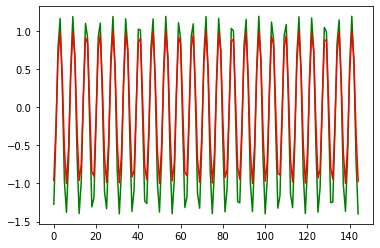

In [7]:
### Graph

plt.plot(preds, 'green')
plt.plot(Y[:, 0], 'red')
plt.show()